In [1]:
from sklearn.datasets import make_classification
import numpy as np
import matplotlib.pyplot as plt

In [2]:
X,y = make_classification(n_samples=100, n_features=2, n_informative=1, n_redundant=0, n_classes=2, n_clusters_per_class=1, random_state=41, hypercube=False, class_sep=10)

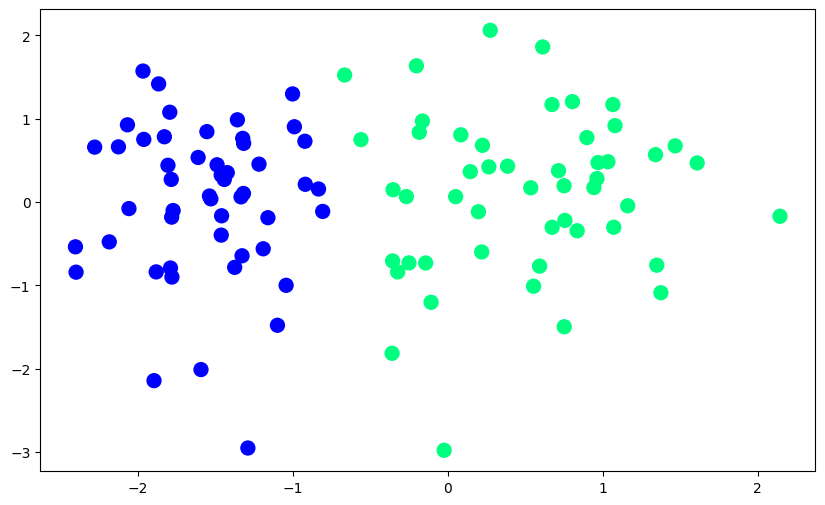

In [3]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0], X[:,1], c = y, cmap='winter', s = 100)
plt.show()

In [4]:
def step(z):
    return 1 if z >0 else 0

In [5]:
def perceptron (X,y):

    X = np.insert(X,0,1, axis = 1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j], weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
    
    return weights[0], weights[1:]

In [6]:
intercept_, coef_ = perceptron(X,y)

In [7]:
print(coef_)
print(intercept_)

[1.3716347  0.19866372]
1.0


In [8]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [9]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

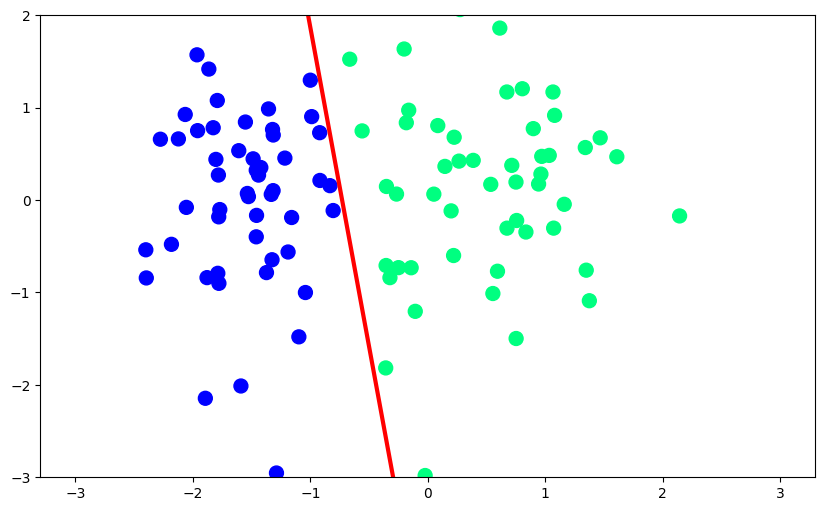

In [10]:
plt.figure(figsize=(10,6))
plt.plot(x_input, y_input, color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1], c = y, cmap='winter', s = 100)
plt.ylim(-3,2)

In [11]:
def perceptron(X,y):
    m = []
    b = []

    X = np.insert(X,0,1, axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j], weights))
        weights = weights + lr*(y[j] - y_hat)*X[j]

        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))
    return m, b

In [12]:
m,b= perceptron(X,y)

In [16]:
%matplotlib notebook
%matplotlib inline
from matplotlib.animation import FuncAnimation
import  matplotlib.animation as animation

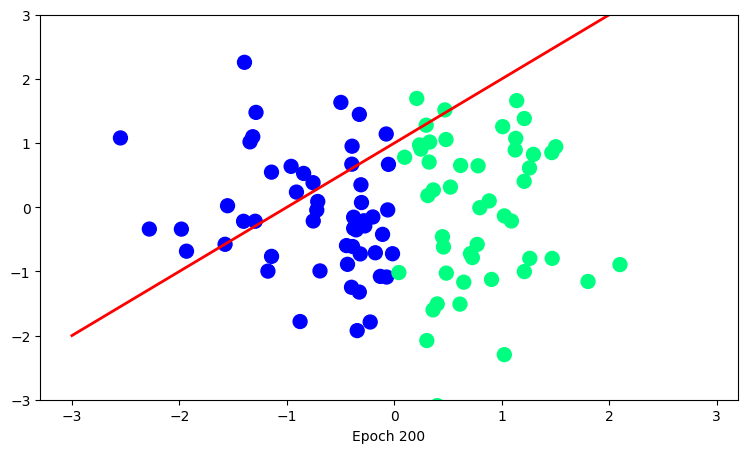

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Sample data (replace with your actual dataset)
X = np.random.randn(100, 2)
y = (X[:, 0] > 0).astype(int)

# Simulated model parameters over 200 epochs
m = np.linspace(-1, 1, 200)  # slope values
b = np.linspace(0, 1, 200)   # intercept values

# Create figure and axis
fig, ax = plt.subplots(figsize=(9, 5))

# X-axis range for decision boundary
x_i = np.arange(-3, 3, 0.1)
y_i = x_i * m[0] + b[0]  # initial line

# Scatter plot of data points
scatter = ax.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)

# Initial decision boundary line
line, = ax.plot(x_i, y_i, 'r-', linewidth=2)

# Set y-axis limits
ax.set_ylim(-3, 3)

# Update function for animation
def update(i):
    y_i = x_i * m[i] + b[i]
    line.set_ydata(y_i)
    ax.set_xlabel(f"Epoch {i+1}")
    return line,

# Create animation
anim = FuncAnimation(fig, update, frames=len(m), interval=100, blit=True)

from IPython.display import HTML
HTML(anim.to_jshtml())

